**This notebook is an exercise in the [Time Series](https://www.kaggle.com/learn/time-series) course.  You can reference the tutorial at [this link](https://www.kaggle.com/ryanholbrook/forecasting-with-machine-learning).**

---


# Introduction #

Run this cell to set everything up!

In [14]:
# Setup notebook
from pathlib import Path
import ipywidgets as widgets
from learntools.time_series.style import *  # plot style settings
from learntools.time_series.utils import (create_multistep_example,
                                          load_multistep_data,
                                          make_lags,
                                          make_multistep_target,
                                          plot_multistep)

import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.multioutput import RegressorChain
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBRegressor


comp_dir = Path('./data/store-sales-time-series-forecasting')

# 2013-01-01 through 2017-08-15
store_sales = pd.read_csv(
    comp_dir / 'train.csv',
    usecols=['store_nbr', 'family', 'date', 'sales', 'onpromotion'],
    dtype={
        'store_nbr': 'category',
        'family': 'category',
        'sales': 'float32',
        'onpromotion': 'uint32',
    },
    parse_dates=['date'],
    infer_datetime_format=True,
)
store_sales['date'] = store_sales.date.dt.to_period('D')
store_sales = store_sales.set_index(['store_nbr', 'family', 'date']).sort_index()

# 2017-01-01 through 2017-08-15
family_sales = (
    store_sales
    .groupby(['family', 'date'])
    .mean()
    .unstack('family')
    .loc['2017']
)

# this only provides promotional data ~ not sure why its included
# 2017-08-16 through 2017-08-31
test = pd.read_csv(
    comp_dir / 'test.csv',
    dtype={
        'store_nbr': 'category',
        'family': 'category',
        'onpromotion': 'uint32',
    },
    parse_dates=['date'],
    infer_datetime_format=True,
)
test['date'] = test.date.dt.to_period('D')
test = test.set_index(['store_nbr', 'family', 'date']).sort_index()

display(store_sales.head(5))
display(family_sales.head(5))
display(test.head(5))

sales  onpromotion
store_nbr family     date                          
1         AUTOMOTIVE 2013-01-01    0.0            0
                     2013-01-02    2.0            0
                     2013-01-03    3.0            0
                     2013-01-04    3.0            0
                     2013-01-05    5.0            0

sales                                              \
family     AUTOMOTIVE BABY CARE     BEAUTY    BEVERAGES     BOOKS   
date                                                                
2017-01-01   0.092593  0.037037   0.055556    74.222221  0.000000   
2017-01-02  11.481482  0.259259  11.648149  6208.055664  0.481481   
2017-01-03   8.296296  0.296296   7.185185  4507.814941  0.814815   
2017-01-04   6.833333  0.333333   6.888889  3911.833252  0.759259   
2017-01-05   6.333333  0.351852   5.925926  3258.796387  0.407407   

                                                                           \
family     BREAD/BAKERY CELEBRATION     CLEANING        DAIRY        DELI   
date                                                                        
2017-01-01     9.084685    0.129630     7.500000    11.518518    3.629167   
2017-01-02   844.836304   14.203704  2233.648193  1545.000000  539.114807   
2017-01-03   665.124084   10.629630  1711.907349  1204.203735  404.300079   
2017-01-04   594.160583   11.185185  1508.036987  1107.796265  309.397675   
2017-01-05   495.511597   12.444445  1241.833374   829.277771  260.776489   

            ... onpromotion                                       \
family      ...   MAGAZINES     MEATS PERSONAL CARE PET SUPPLIES   
date        ...                                                    
2017-01-01  ...         0.0  0.018519      0.111111     0.018519   
2017-01-02  ...         0.0  0.462963     10.592593     0.537037   
2017-01-03  ...         0.0  0.481481      9.722222     0.444444   
2017-01-04  ...         0.0  0.370370     12.037037     0.444444   
2017-01-05  ...         0.0  8.981481      5.666667     0.000000   

                                                                         \
family     PLAYERS AND ELECTRONICS   POULTRY PREPARED FOODS     PRODUCE   
date                                                                      
2017-01-01                     0.0  0.000000       0.037037    0.129630   
2017-01-02                     0.0  0.259259       1.166667    5.629630   
2017-01-03                     0.0  0.388889       1.351852   56.296296   
2017-01-04                     0.0  0.296296       5.444444  101.277778   
2017-01-05                     0.0  0.296296       0.907407    5.018519   

                                                 
family     SCHOOL AND OFFICE SUPPLIES   SEAFOOD  
date                                             
2017-01-01                        0.0  0.000000  
2017-01-02                        0.0  0.407407  
2017-01-03                        0.0  0.407407  
2017-01-04                        0.0  0.333333  
2017-01-05                        0.0  0.444444  

[5 rows x 66 columns]

id  onpromotion
store_nbr family     date                            
1         AUTOMOTIVE 2017-08-16  3000888            0
                     2017-08-17  3002670            0
                     2017-08-18  3004452            0
                     2017-08-19  3006234            0
                     2017-08-20  3008016            0

-------------------------------------------------------------------------------

Consider the following three forecasting tasks:

a. 3-step forecast using 4 lag features with a 2-step lead time<br>
b. 1-step forecast using 3 lag features with a 1-step lead time<br>
c. 3-step forecast using 4 lag features with a 1-step lead time<br>

Run the next cell to see three datasets, each representing one of the tasks above.

In [15]:
datasets = load_multistep_data()

data_tabs = widgets.Tab([widgets.Output() for _ in enumerate(datasets)])
for i, df in enumerate(datasets):
    data_tabs.set_title(i, f'Dataset {i+1}')
    with data_tabs.children[i]:
        display(df)

display(data_tabs)

# 1) Match description to dataset

Can you match each task to the appropriate dataset?

task_a = 2 \
task_b = 1 \
task_c = 3

-------------------------------------------------------------------------------

Look at the time indexes of the training and test sets. From this information, can you identify the forecasting task for *Store Sales*?

In [16]:
# 2013-01-01 through 2017-08-15 (forecast origin)
print("Training Data", "\n" + "-" * 13 + "\n", store_sales)
print("\n")
# 2017-08-16 through 2017-08-31 (forecast horizon)
print("Test Data", "\n" + "-" * 9 + "\n", test)

Training Data 
-------------
                                      sales  onpromotion
store_nbr family     date                              
1         AUTOMOTIVE 2013-01-01   0.000000            0
                     2013-01-02   2.000000            0
                     2013-01-03   3.000000            0
                     2013-01-04   3.000000            0
                     2013-01-05   5.000000            0
...                                    ...          ...
9         SEAFOOD    2017-08-11  23.830999            0
                     2017-08-12  16.859001            4
                     2017-08-13  20.000000            0
                     2017-08-14  17.000000            0
                     2017-08-15  16.000000            0

[3000888 rows x 2 columns]


Test Data 
---------
                                       id  onpromotion
store_nbr family     date                            
1         AUTOMOTIVE 2017-08-16  3000888            0
                     2017-08

# 2) Identify the forecasting task for *Store Sales* competition

Try to identify the *forecast origin* and the *forecast horizon*. How many steps are within the forecast horizon? What is the lead time for the forecast?

Run this cell after you've thought about your answer.

The training set ends on `2017-08-15`, which gives us the forecast origin. The test set comprises the dates `2017-08-16` to `2017-08-31`, and this gives us the forecast horizon. There is one step between the origin and horizon, so we have a lead time of one day.

Put another way, we need a 16-step forecast (8/16 to 8/31) with a 1-step lead time. We can use lags starting with lag 1, and we make the entire 16-step forecast using features from `2017-08-15`.

-------------------------------------------------------------------------------

In the tutorial we saw how to create a multistep dataset for a single time series. Fortunately, we can use exactly the same procedure for datasets of multiple series.

# 3) Create multistep dataset for *Store Sales*

Create targets suitable for the *Store Sales* forecasting task. Use 4 days of lag features with 16-step forecast with a 1-step lead time. Drop any missing values from both targets and features.

In [17]:
# 2017-01-01 through 2017-08-15
sales = family_sales.loc[:, 'sales']

# Make 4 lags (features): 2017-01-05 (after dropna) through 2017-07-31
X = make_lags(sales, lags=4, lead_time=1).dropna()

# Make steps (target): 2017-01-01 through 2017-07-31 (16 steps before 2017-08-15)
y = make_multistep_target(sales, steps=16).dropna()

# 2017-01-05 through 2017-07-31: X has 4*33=132 cols and y has 16*32=528 cols
y, X = y.align(X, join='inner', axis=0)

-------------------------------------------------------------------------------

In the tutorial, we saw how to forecast with the MultiOutput and Direct strategies on the *Flu Trends* series. Now, you'll apply the DirRec strategy to the multiple time series of *Store Sales*.

Make sure you've successfully completed the previous exercise and then run this cell to prepare the data for XGBoost.

In [18]:
le = LabelEncoder()
X = (X
    .stack('family')  # wide to long
    .reset_index('family')  # convert index to column
    .assign(family=lambda x: le.fit_transform(x.family))  # label encode
)
y = y.stack('family')  # wide to long

In [19]:
X

,family,y_lag_1,y_lag_2,y_lag_3,y_lag_4
date,,,,,
2017-01-05,0,6.833333,8.296296,11.481482,0.092593
2017-01-05,1,0.333333,0.296296,0.259259,0.037037
2017-01-05,2,6.888889,7.185185,11.648149,0.055556
2017-01-05,3,3911.833252,4507.814941,6208.055664,74.222221
2017-01-05,4,0.759259,0.814815,0.481481,0.000000
...,...,...,...,...,...
2017-07-31,28,464.615662,416.242065,528.171875,269.486877
2017-07-31,29,101.991165,100.165146,87.455833,77.199738
2017-07-31,30,2704.551758,2444.234375,2073.127686,1675.579346


In [20]:
y

y_step_1     y_step_2     y_step_3  \
date       family                                                              
2017-01-05 AUTOMOTIVE                     6.333333     6.018518    10.259259   
           BABY CARE                      0.351852     0.277778     0.259259   
           BEAUTY                         5.925926     6.518518    10.037037   
           BEVERAGES                   3258.796387  3507.277832  4848.518555   
           BOOKS                          0.407407     0.537037     0.481481   
...                                            ...          ...          ...   
2017-07-31 POULTRY                      364.955658   403.601349   377.313965   
           PREPARED FOODS                84.698647    87.836800    88.735962   
           PRODUCE                     2257.140625  2609.180176  3122.895752   
           SCHOOL AND OFFICE SUPPLIES    30.111111    49.333332    57.481480   
           SEAFOOD                       20.488333    20.346851    20.801037   

                                          y_step_4     y_step_5     y_step_6  \
date       family                                                              
2017-01-05 AUTOMOTIVE                     9.388889     5.944445     4.777778   
           BABY CARE                      0.240741     0.444444     0.240741   
           BEAUTY                        11.611111     5.648148     6.500000   
           BEVERAGES                   5503.647949  3448.203613  3171.740723   
           BOOKS                          0.722222     0.500000     0.518519   
...                                            ...          ...          ...   
2017-07-31 POULTRY                      316.436096   533.497070   416.454010   
           PREPARED FOODS                77.172997    91.886757   100.384964   
           PRODUCE                     1792.220947  2079.319580  2418.970215   
           SCHOOL AND OFFICE SUPPLIES    51.907406    63.222221    85.203705   
           SEAFOOD                       17.116297    25.553963    24.209518   

                                          y_step_7     y_step_8     y_step_9  \
date       family                                                              
2017-01-05 AUTOMOTIVE                     6.314815     5.388889     5.240741   
           BABY CARE                      0.277778     0.296296     0.296296   
           BEAUTY                         5.277778     4.370370     4.703704   
           BEVERAGES                   3046.870361  2693.722168  3226.037109   
           BOOKS                          0.481481     0.388889     0.444444   
...                                            ...          ...          ...   
2017-07-31 POULTRY                      464.596558   344.051727   313.780884   
           PREPARED FOODS               102.248146    86.627441    77.344131   
           PRODUCE                     2675.105713  2111.133545  2168.535400   
           SCHOOL AND OFFICE SUPPLIES   100.277779    64.407410    59.759258   
           SEAFOOD                       23.512852    18.419851    18.481131   

                                         y_step_10    y_step_11    y_step_12  \
date       family                                                              
2017-01-05 AUTOMOTIVE                     8.500000    10.259259     6.407407   
           BABY CARE                      0.388889     0.425926     0.314815   
           BEAUTY                         7.777778     9.037037     5.648148   
           BEVERAGES                   4667.296387  5580.611328  3700.370361   
           BOOKS                          0.574074     0.555556     0.388889   
...                                            ...          ...          ...   
2017-07-31 POULTRY                      305.270203   278.819855   468.857361   
           PREPARED FOODS                84.796539    78.791443    96.286926   
           PRODUCE                     2663.076172  1670.264893  2198.854492   
           SCHOOL AND OFFICE SUPPLIES  

# 4) Forecast with the DirRec strategy

Instatiate a model that applies the DirRec strategy to XGBoost.

In [21]:
# RegressorChain is a multi-label model that arranges regressions into a chain
from sklearn.multioutput import RegressorChain

# create model
model = RegressorChain(base_estimator=XGBRegressor())

Run this cell if you'd like to train this model.

In [22]:
_ = model.fit(X, y)

y_pred = pd.DataFrame(
    model.predict(X),
    index=y.index,
    columns=y.columns, # steps
).clip(0.0)

In [23]:
y_pred.head()

y_step_1     y_step_2     y_step_3     y_step_4  \
date       family                                                           
2017-01-05 AUTOMOTIVE     6.706484     6.588345     7.489037     6.631713   
           BABY CARE      0.945634     1.420450     1.106641     1.412934   
           BEAUTY         6.706484     6.588345     7.489037     7.386412   
           BEVERAGES   3262.328613  3507.129395  4851.775879  5490.772949   
           BOOKS          1.168675     1.420450     1.106641     1.412934   

                          y_step_5     y_step_6     y_step_7     y_step_8  \
date       family                                                           
2017-01-05 AUTOMOTIVE     7.686126     6.872079     6.600883     6.618326   
           BABY CARE      0.911818     1.030322     0.990770     1.474051   
           BEAUTY         7.686126     6.872079     6.600883     6.800453   
           BEVERAGES   3439.650879  3164.806641  3051.604980  2790.089600   
           BOOKS          0.911818     1.030322     1.109941     1.474051   

                          y_step_9    y_step_10    y_step_11    y_step_12  \
date       family                                                           
2017-01-05 AUTOMOTIVE     6.796880     6.139919     6.621857     6.541267   
           BABY CARE      1.755131     1.427863     1.460183     1.483901   
           BEAUTY         6.796880     6.139919     6.621857     6.541267   
           BEVERAGES   3221.736084  4674.974121  5587.095215  3782.173096   
           BOOKS          1.755131     1.427863     1.460183     1.483901   

                         y_step_13    y_step_14    y_step_15    y_step_16  
date       family                                                          
2017-01-05 AUTOMOTIVE     6.464437     6.452060     6.037592     6.704325  
           BABY CARE      1.466740     1.270841     1.036739     1.223531  
           BEAUTY         6.464437     6.391368     6.287976     6.704325  
           BEVERAGES   3405.334473  3322.945557  2718.560547  2982.668457  
           BOOKS          1.466740     1.270841     1.036739     1.223531

And use this code to see a sample of the 16-step predictions this model makes on the training data.

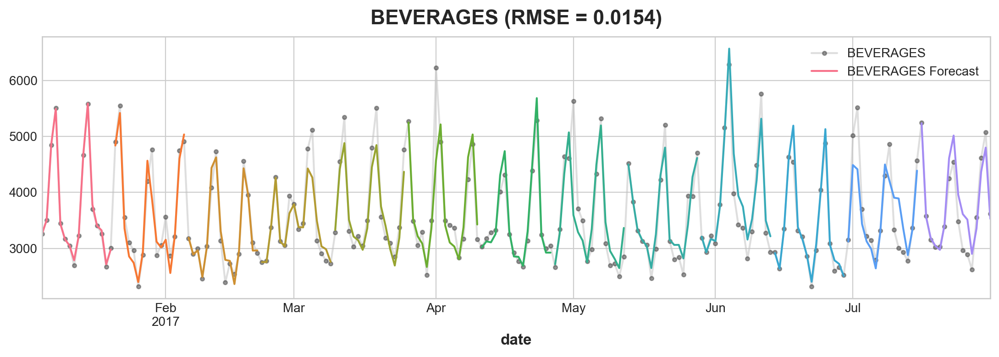

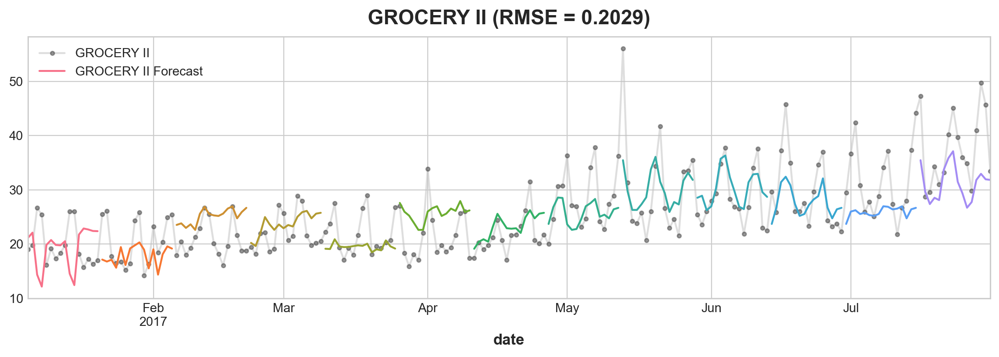

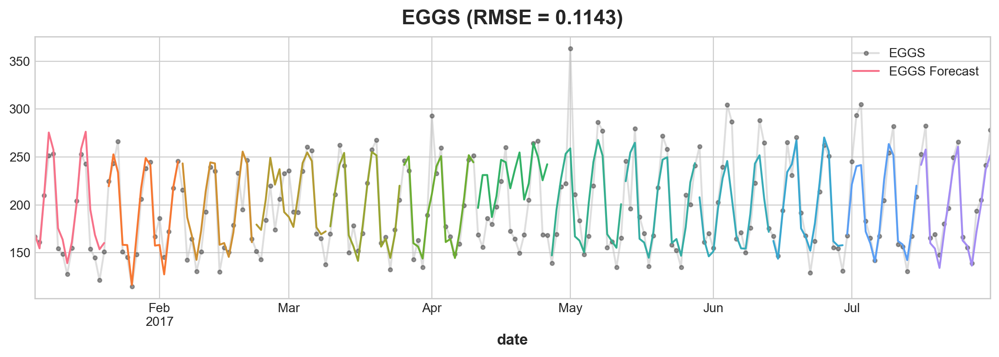

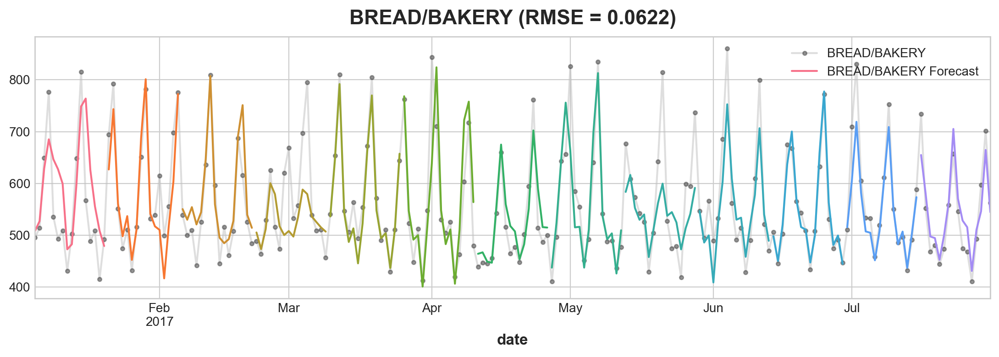

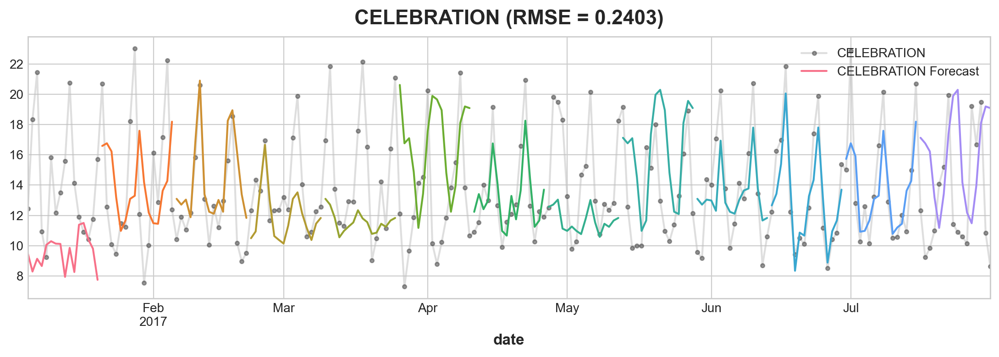

...

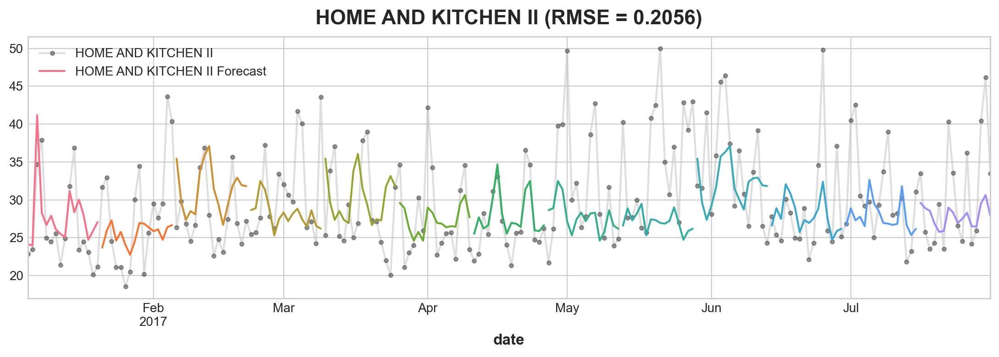

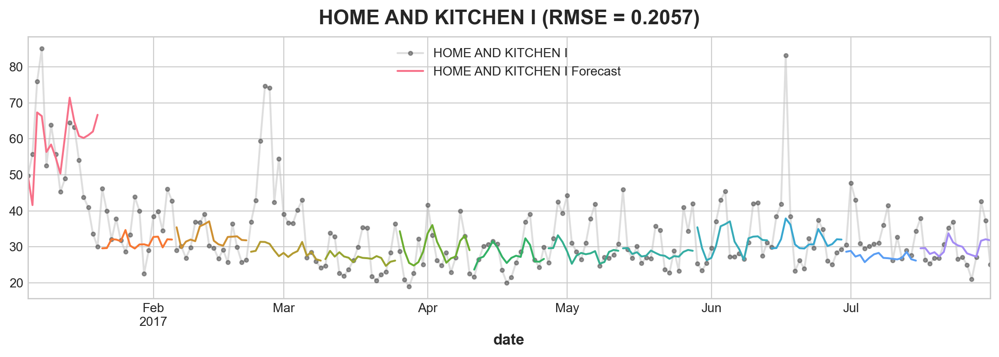

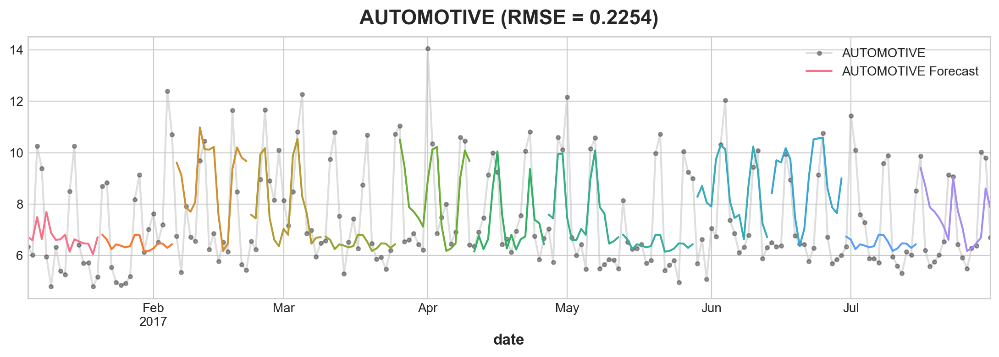

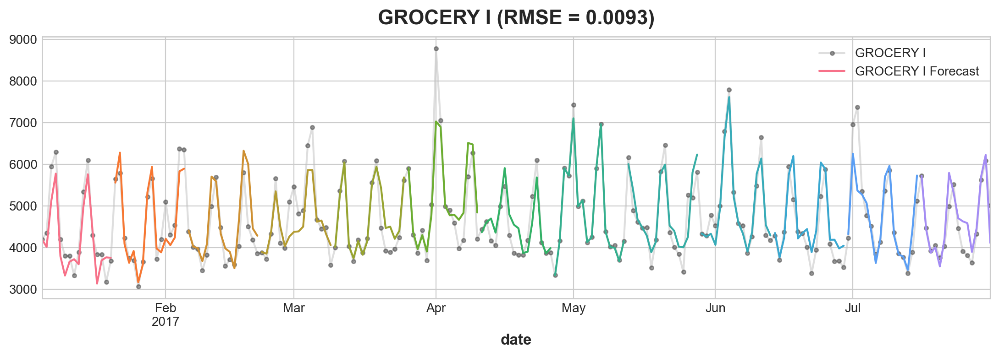

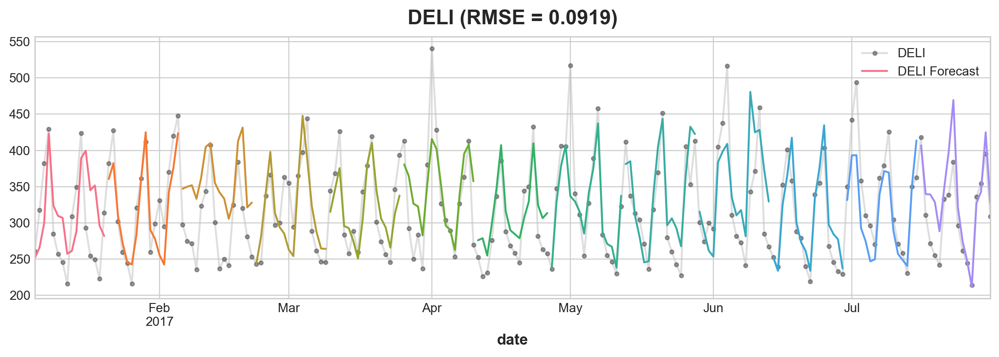

In [24]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_log_error

#START = '2017-04-01' #- not sure why this arbitrary date was chosen
START = '2017-01-05'
EVERY = 16
families = set(y.index.get_level_values(1).to_list())

for f in families:
    y_pred_f = y_pred.xs(f, level='family', axis=0).loc[START:]
    y_ = family_sales.loc[START:'2017-07-31', 'sales'].loc[:, f]
    
    #test_rmse = mean_squared_error(y_, y_pred_f.mean(axis=1), squared=False) 
    test_rmse = mean_squared_log_error(y_, y_pred_f.y_step_1, squared=False)
    #test_rmse = mean_squared_error(y, y_, squared=False) 
    
    fig, ax = plt.subplots(1, 1, figsize=(11, 4))
    ax = y_.plot(**plot_params, ax=ax, alpha=0.5, title=f'{f} (RMSE = {test_rmse:.4f})')
    ax = plot_multistep(y_pred_f, ax=ax, every=EVERY)
    _ = ax.legend([f, f + ' Forecast'])

### Evaluate model (overall)

In [25]:
test_rmsle = mean_squared_log_error(y, y_pred, squared=False)
print(f"Test RMSLE: {test_rmsle:.2f}")

Test RMSLE: 0.33


###### Next Steps #

Congratulations! You've completed Kaggle's *Time Series* course. If you haven't already, join our companion competition: [Store Sales - Time Series Forecasting](https://www.kaggle.com/c/29781) and apply the skills you've learned.

Here are the writeups of the top performers for this competition:
https://www.kaggle.com/c/rossmann-store-sales/discussion/17896

For inspiration, check out Kaggle's previous forecasting competitions. Studying winning competition solutions is a great way to upgrade your skills.

- [**Corporación Favorita**](https://www.kaggle.com/c/favorita-grocery-sales-forecasting): the competition *Store Sales* is derived from.
- [**Rossmann Store Sales**](https://www.kaggle.com/c/rossmann-store-sales)
- [**Wikipedia Web Traffic**](https://www.kaggle.com/c/web-traffic-time-series-forecasting/)
- [**Walmart Store Sales**](https://www.kaggle.com/c/walmart-recruiting-store-sales-forecasting)
- [**Walmart Sales in Stormy Weather**](https://www.kaggle.com/c/walmart-recruiting-sales-in-stormy-weather)
- [**M5 Forecasting - Accuracy**](https://www.kaggle.com/c/m5-forecasting-accuracy)

# References #

Here are some great resources you might like to consult for more on time series and forecasting. They all played a part in shaping this course:

- *Learnings from Kaggle's forecasting competitions*, an article by Casper Solheim Bojer and Jens Peder Meldgaard.
- *Forecasting: Principles and Practice*, a book by Rob J Hyndmann and George Athanasopoulos.
- *Practical Time Series Forecasting with R*, a book by Galit Shmueli and Kenneth C. Lichtendahl Jr.
- *Time Series Analysis and Its Applications*, a book by Robert H. Shumway and David S. Stoffer.
- *Machine learning strategies for time series forecasting*, an article by Gianluca Bontempi, Souhaib Ben Taieb, and Yann-Aël Le Borgne.
- *On the use of cross-validation for time series predictor evaluation*, an article by Christoph Bergmeir and José M. Benítez.


---




*Have questions or comments? Visit the [course discussion forum](https://www.kaggle.com/learn/time-series/discussion) to chat with other learners.*